<a href="https://colab.research.google.com/github/MorningStarTM/gptController/blob/main/notebook/GPT_render.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!apt-get install x11-utils > /dev/null 2>&1
!pip install pyglet > /dev/null 2>&1
!apt-get install -y xvfb python-opengl > /dev/null 2>&1

In [ ]:
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!pip install xvfbwrapper

In [ ]:
!sudo apt-get install xvfb

In [ ]:
!pip install swig

In [ ]:
!pip install gym[box2d]

In [4]:
import gym
import numpy as np
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay
import numpy as np
import pandas as pd
import re
import string
from tqdm.notebook import tqdm
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import classification_report, accuracy_score
from transformers import (
    TrainingArguments,
    AutoModelForCausalLM,
    AutoTokenizer,
    pipeline,
    logging,
)

In [ ]:
from pyvirtualdisplay import Display
display = Display(visible=0, size=(400, 300))
display.start()

In [5]:
from huggingface_hub import notebook_login
notebook_login()

In [6]:

import os
batch_size = 16
num_workers = os.cpu_count()
max_steps = 6000
bf16 = False
fp16 = True
gradient_accumulation_steps = 2
context_length = 256
logging_steps = 500
save_steps = 500
learning_rate = 0.0001
model_name = 'ErnestBeckham/GPT-2-as-Controller'
out_dir = 'outputs/gpt2-as-Controller'

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
if bf16:
    model = AutoModelForCausalLM.from_pretrained(model_name).to(dtype=torch.bfloat16)
else:
    model = AutoModelForCausalLM.from_pretrained(model_name)
print(model)
# Total parameters and trainable parameters.
total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/965 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/498M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/185 [00:00<?, ?B/s]

GPT2LMHeadModel(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-11): 12 x GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2SdpaAttention(
          (c_attn): Conv1D()
          (c_proj): Conv1D()
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D()
          (c_proj): Conv1D()
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (lm_head): Linear(in_features=768, out_features=50257, bias=False)
)
124,439,808 total parameters.
124,439,808 training parameters.


In [8]:
tokenizer = AutoTokenizer.from_pretrained(
    model_name,
    trust_remote_code=True,
    use_fast=False
)
tokenizer.pad_token = tokenizer.eos_token

tokenizer_config.json:   0%|          | 0.00/525 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/999k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/470 [00:00<?, ?B/s]

In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
pipe = pipeline(
    task='text-generation',
    model=model,
    tokenizer=tokenizer,
    max_length=context_length, # Prompt + new tokens to generate.
    device_map=device
)

In [11]:
def predict_action(obs):
    prompt = f"### Instruction:\nAssume You are required for control lunar lander. So you want to control the lunar lander efficiently. The task that is you want to predict the action for control the lunar lander.\n\n### Input:\n{obs}\n### Response:"

    # Generate output from the model
    outputs = pipe(
        prompt,
        do_sample=True,
        temperature=0.7,
        top_k=50,
        top_p=0.95,
        repetition_penalty=1.1,
    )

    # Extract predicted action (after the 'Response:')
    generated_text = outputs[0]['generated_text'].split('Response:')[-1].strip()

    # Check if the prediction is empty, if so, default to 0
    try:
        predicted_action = int(generated_text)
    except ValueError:
        predicted_action = 0  # In case the output is not a valid integer
    return predicted_action

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [17]:
env = gym.make("LunarLander-v2")
obs = env.reset()
obs = obs.tolist()
predict_action(obs)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1375: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


1

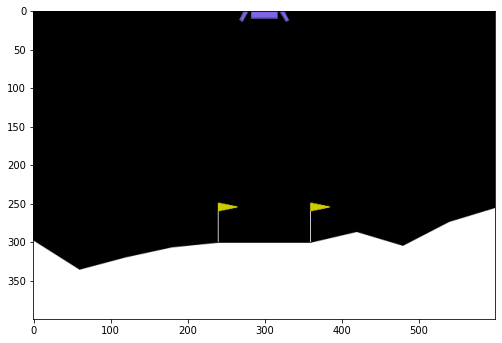

In [19]:
import gym
from IPython import display
from pyvirtualdisplay import Display
import matplotlib.pyplot as plt
from matplotlib import animation

d = Display()
d.start()

env = gym.make('LunarLander-v2')

o = env.reset()

img = []
for _ in range(500):
    o = o.tolist()
    action = predict_action(o)
    o, r, d, i = env.step(action) # Take action from DNN in actual training.

    display.clear_output(wait=True)
    img.append(env.render('rgb_array'))

    if d:
        env.reset()

dpi = 72
interval = 50 # ms

plt.figure(figsize=(img[0].shape[1]/dpi,img[0].shape[0]/dpi),dpi=dpi)
patch = plt.imshow(img[0])
plt.axis=('off')
animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(),animate,frames=len(img),interval=interval)
display.display(display.HTML(ani.to_jshtml()))